<a href="https://colab.research.google.com/github/ACoolA-008/Data_Science_Projects/blob/main/Deep%20Learning%20Projects/C4.%20CNN/Cats_Versus_Dogs_Image_Classification_Using_CNNs.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [44]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [8]:
%cd /content/drive/MyDrive/Kaggle/PetData2

/content/drive/MyDrive/Kaggle/PetData2


In [ ]:
# !kaggle competitions download -c new-york-city-taxi-fare-prediction

In [ ]:
# ! unzip kagglecatsanddogs_5340.zip

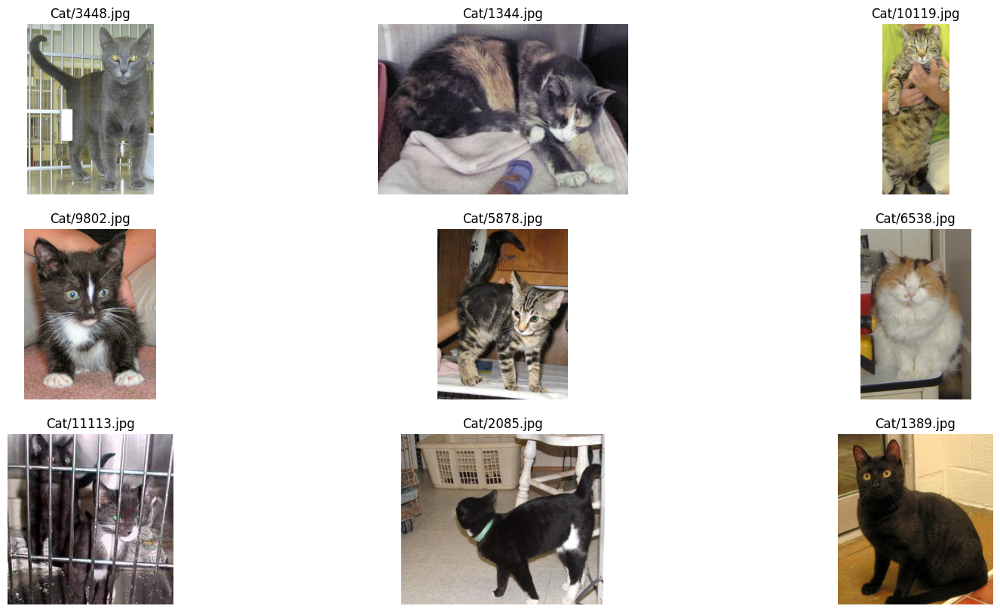

In [17]:
from matplotlib import pyplot as plt
import os
import random

# Get a list of file names
# _,_, cat_images = next(os.walk('/content/drive/MyDrive/Kaggle/PetImages/Cat'))
_,_, cat_images = next(os.walk('/content/drive/MyDrive/Kaggle/PetData2/PetImages/Cat'))


# Create a 3 by 3 plot to show cat images
fig, ax = plt.subplots(3,3,figsize=(20,10))

# Randomly select and show an image
for idx, img in enumerate(random.sample(cat_images,9)):
  img_read = plt.imread("/content/drive/MyDrive/Kaggle/PetData2/PetImages/Cat/"+img)
  ax[int(idx/3), idx%3].imshow(img_read)
  ax[int(idx/3), idx%3].axis('off')
  ax[int(idx/3), idx%3].set_title('Cat/'+img)
plt.show()

In [6]:
# From the images above we notice that
# they have different dimensions
# cats are centered
# due to occlusion, some body parts of the cats are hidden such as tails.

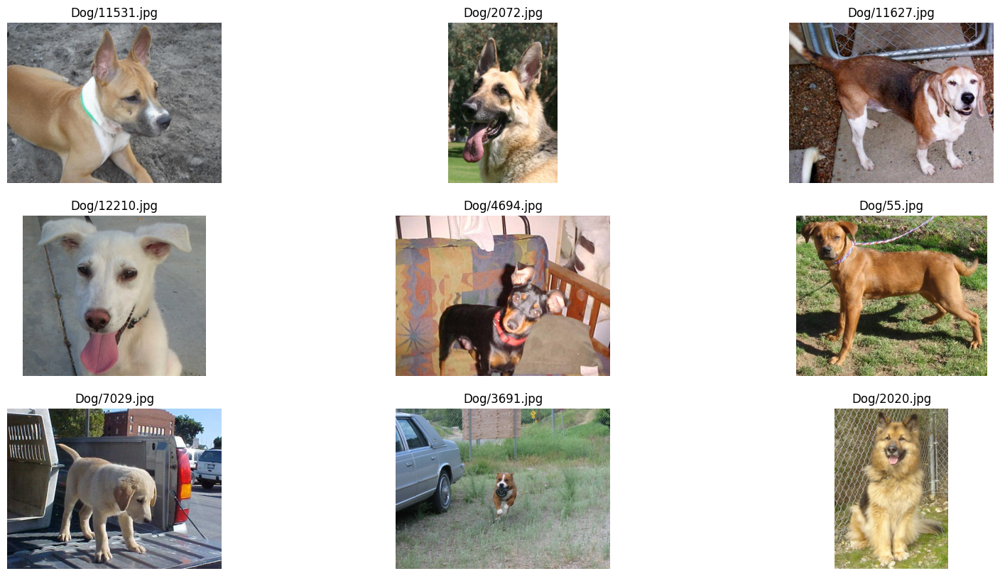

In [18]:
# Observing Dog Images

# Get a list of file names, ignore the root path and a list of directories from this function call.
_,_, dog_images = next(os.walk('/content/drive/MyDrive/Kaggle/PetData2/PetImages/Dog'))

# Create a 3 by 3 grid of subplots to show cat images. Each image is set to a size of 20 by 10.
fig, ax = plt.subplots(3,3,figsize=(20,10))

# Randomly select and show 9 images of dogs
for idx, img in enumerate(random.sample(dog_images,9)):
  img_read = plt.imread("/content/drive/MyDrive/Kaggle/PetData2/PetImages/Dog/"+img)
  # arrange grid allocation to display images: by rows and columns
  ax[int(idx/3), idx%3].imshow(img_read)
  ax[int(idx/3), idx%3].axis('off')
  ax[int(idx/3), idx%3].set_title('Dog/'+img)
plt.show()

In [19]:
len(dog_images)

12501

In [20]:
len(cat_images)

12501

In [ ]:
# pip install mypy

In [25]:
# pip install piexif

In [31]:
# We observe the directory of the downloaded dataset
# there is no specified train set or test set inside each of dog and cat folders
# therefore, we created a util function to devide the images in each of the dog and cat folders into
# train set and test set with 80% of the training data and 20% of testing data


# Mount Google Drive to access files across notebooks
# from google.colab import drive
# drive.mount('/content/drive')

# Import the notebook with the function
%run '/content/drive/MyDrive/Colab Notebooks/Oreiley Deep Learning Books/Neural Network Projects with Python/C4. Cats Versus Dogs Image Classification Using CNNs/utils.ipynb'

source_folder = '/content/drive/MyDrive/Kaggle/PetData2/PetImages/'

# Call the function
train_test_split(source_folder)


5402.jpg


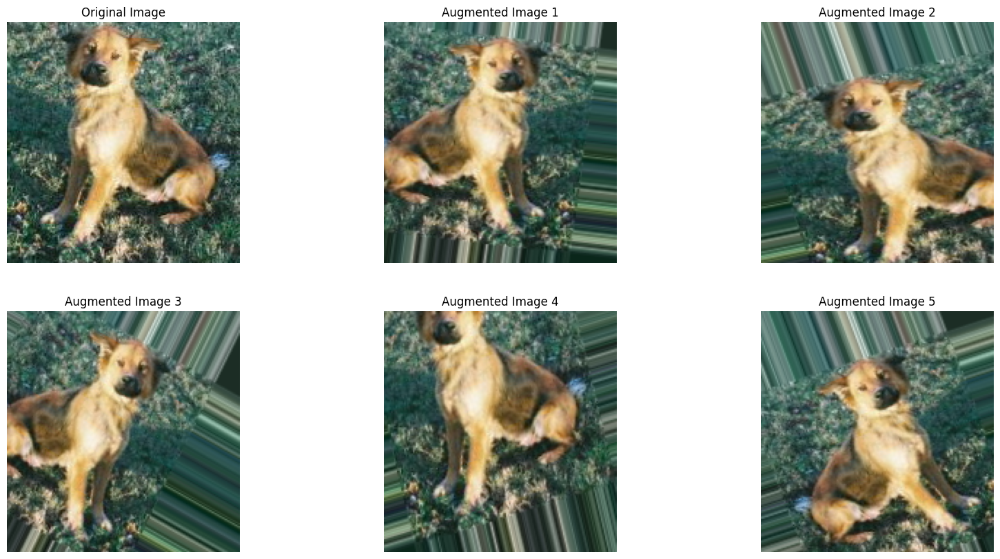

In [53]:
# Perform Image Augmentation

from keras.preprocessing.image import ImageDataGenerator

image_generator = ImageDataGenerator(rotation_range = 30,
                                     width_shift_range = 0.2,
                                     height_shift_range = 0.2,
                                     zoom_range = 0.2,
                                     horizontal_flip=True,
                                     fill_mode='nearest')


fig, ax = plt.subplots(2,3, figsize=(20,10))
all_images = []

_, _, dog_images = next(os.walk('/content/drive/MyDrive/Kaggle/PetData2/PetImages/Train/Dog/'))
random_img = random.sample(dog_images, 1)[0]
print(random_img)
random_img = plt.imread('/content/drive/MyDrive/Kaggle/PetData2/PetImages/Train/Dog/'+random_img)
all_images.append(random_img)

random_img = random_img.reshape((1,) + random_img.shape)
sample_augmented_images = image_generator.flow(random_img)

for _ in range(5):
	augmented_imgs = sample_augmented_images.next()
	for img in augmented_imgs:
		all_images.append(img.astype('uint8'))

for idx, img in enumerate(all_images):
	ax[int(idx/3), idx%3].imshow(img)
	ax[int(idx/3), idx%3].axis('off')
	if idx == 0:
		ax[int(idx/3), idx%3].set_title('Original Image')
	else:
		ax[int(idx/3), idx%3].set_title('Augmented Image {}'.format(idx))


plt.show()

Check whether both folders are loaded with images

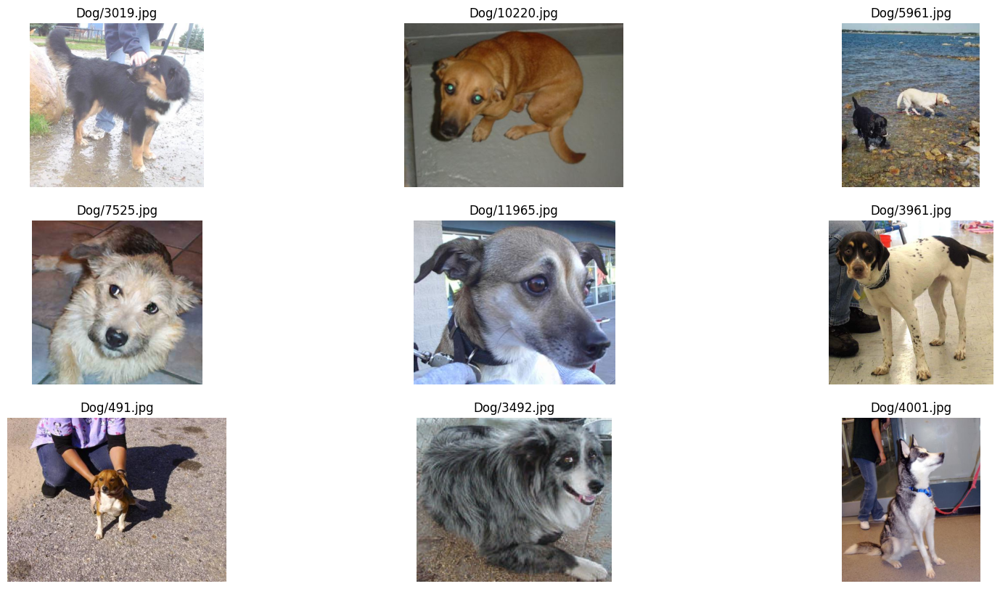

In [66]:
# # Get a list of file names, ignore the root path and a list of directories from this function call.
# _,_, dd_images = next(os.walk('/content/drive/MyDrive/Kaggle/PetData2/PetImages/Train/Dog/'))

# # Create a 3 by 3 grid of subplots to show cat images. Each image is set to a size of 20 by 10.
# fig, ax = plt.subplots(3,3,figsize=(20,10))

# # Randomly select and show 9 images of dogs
# for idx, img in enumerate(random.sample(dd_images,9)):
#   img_read = plt.imread("/content/drive/MyDrive/Kaggle/PetData2/PetImages/Train/Dog/"+img)
#   # arrange grid allocation to display images: by rows and columns
#   ax[int(idx/3), idx%3].imshow(img_read)
#   ax[int(idx/3), idx%3].axis('off')
#   ax[int(idx/3), idx%3].set_title('Dog/'+img)
# plt.show()

In [67]:
# len(dd_images)

9999

In [65]:
# len(cc_images)

9998

Model Building

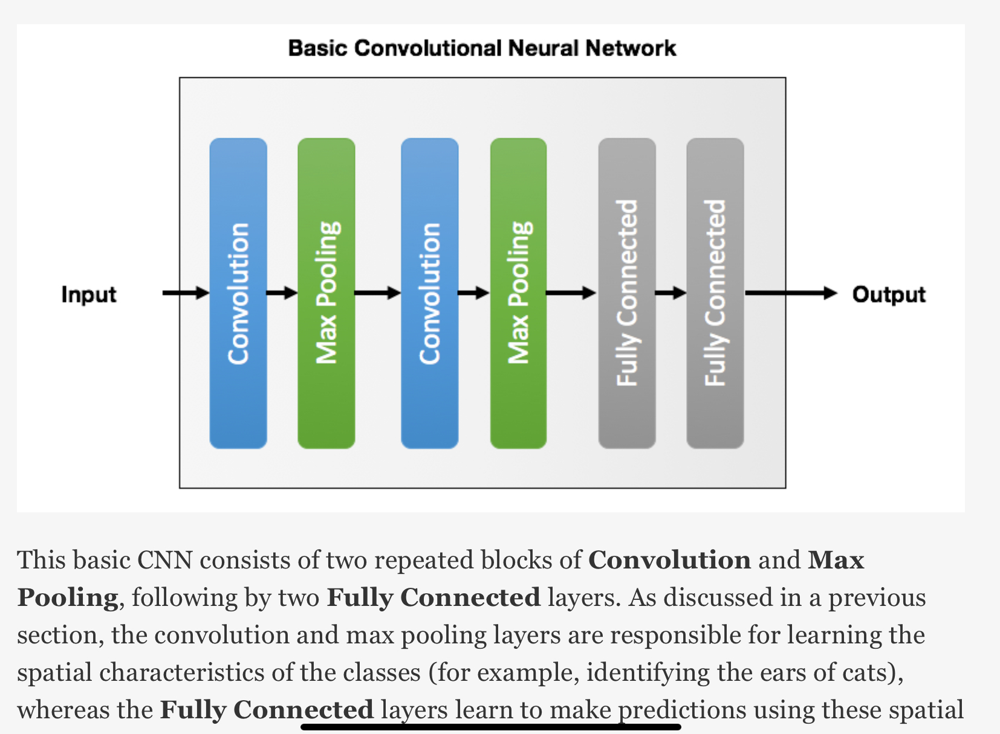

In [37]:
from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D
from keras.layers import Dropout, Flatten, Dense
from keras.preprocessing.image import ImageDataGenerator


In [70]:
# Convolutional Layer's filter size is set to 3 x 3
FILTER_SIZE = 3
# Number of filters per layer is 32
NUM_FILTERS = 32
# Input image size is set to 32 x 32 pixels
INPUT_SIZE = 32
# Maxpooling size is set to 2 x 2
MAXPOOL_SIZE = 2
# Use 16 images per mini-batch for training
BATCH_SIZE = 16
# Number of iterations in each training epoch
STEPS_PER_EPOCH = 20000//BATCH_SIZE
# Total number of epochs for training the model
EPOCHS = 10

In [71]:
model = Sequential()

# Add the first convolutional layer with 32 filters and each in size of 3 x 3
model.add(Conv2D(NUM_FILTERS, (FILTER_SIZE, FILTER_SIZE),
                 input_shape = (INPUT_SIZE, INPUT_SIZE, 3),
                 activation = 'relu'))

# Add the first maxpooling layer after the first conv layer
model.add(MaxPooling2D(pool_size=(MAXPOOL_SIZE, MAXPOOL_SIZE)))

# Add the second convolutional layer with 32 filters and each in size of 3 x 3
model.add(Conv2D(NUM_FILTERS, (FILTER_SIZE, FILTER_SIZE),
                 input_shape = (INPUT_SIZE, INPUT_SIZE, 3),
                 activation = 'relu'))

# Add the second maxpooling layer after the second conv layer
model.add(MaxPooling2D(pool_size=(MAXPOOL_SIZE, MAXPOOL_SIZE)))

# Add a Flatten layer
model.add(Flatten())

# Add the first fully connected layer with 128 nodes
model.add(Dense(units=128, activation='relu'))

# Add a dropout layer: set 50% of the weights to 0 to avoid overfitting
model.add(Dropout(0.5))

# Add the second fully connected layer with 1 node
model.add(Dense(units=1, activation='sigmoid'))


In [72]:
# compile the CNN
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

In [73]:
# Training the CNN

training_data_generator = ImageDataGenerator(rescale = 1./255)

training_set = training_data_generator.flow_from_directory(source_folder+'Train/',
                                                target_size = (INPUT_SIZE, INPUT_SIZE),
                                                batch_size = BATCH_SIZE,
                                                class_mode = 'binary')

model.fit(training_set, steps_per_epoch = STEPS_PER_EPOCH, epochs = EPOCHS, verbose=1)

Found 19997 images belonging to 2 classes.
Epoch 1/10
1250/1250 [==============================] - 79s 56ms/step - loss: 0.6482 - accuracy: 0.6111
Epoch 2/10
1250/1250 [==============================] - 64s 51ms/step - loss: 0.5538 - accuracy: 0.7213
Epoch 3/10
1250/1250 [==============================] - 65s 52ms/step - loss: 0.5087 - accuracy: 0.7542
Epoch 4/10
1250/1250 [==============================] - 65s 52ms/step - loss: 0.4761 - accuracy: 0.7715
Epoch 5/10
1250/1250 [==============================] - 64s 52ms/step - loss: 0.4513 - accuracy: 0.7884
Epoch 6/10
1250/1250 [==============================] - 63s 50ms/step - loss: 0.4310 - accuracy: 0.8005
Epoch 7/10
1250/1250 [==============================] - 64s 51ms/step - loss: 0.4055 - accuracy: 0.8131
Epoch 8/10
1250/1250 [==============================] - 76s 61ms/step - loss: 0.3825 - accuracy: 0.8266
Epoch 9/10
1250/1250 [==============================] - 86s 69ms/step - loss: 0.3641 - accuracy: 0.8363
Epoch 10/10
1250/1250

In [75]:
# Evaluate the results with the testing set
testing_data_generator = ImageDataGenerator(rescale = 1./255)

testing_set = training_data_generator.flow_from_directory(source_folder+'Test/',
                                                target_size = (INPUT_SIZE, INPUT_SIZE),
                                                batch_size = BATCH_SIZE,
                                                class_mode = 'binary')

score = model.evaluate(testing_set, steps=len(testing_set))

for idx, metric in enumerate(model.metrics_names):
  print("{}:{}".format(metric, score[idx]))

Found 5000 images belonging to 2 classes.


<ipython-input-75-738f30a4abe5>:9: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  score = model.evaluate_generator(testing_set, steps=len(testing_set))


loss:0.4928032159805298
accuracy:0.782800018787384


Use a pre-trained CNN model

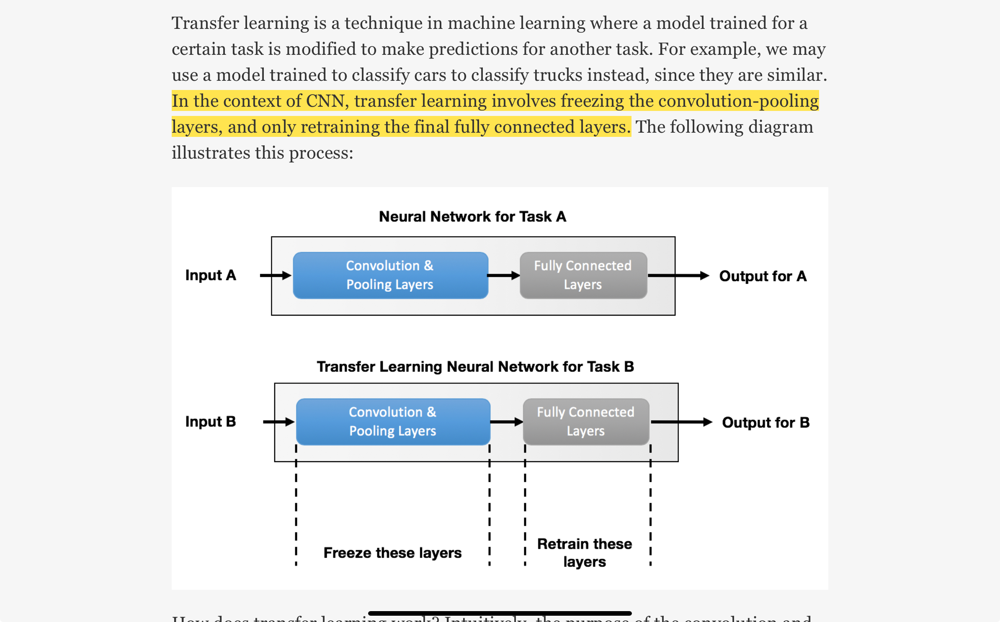

In [79]:
# Create a VGG16 Model

from keras.applications.vgg16 import VGG16

INPUT_SIZE = 128

# include_top = False: we ask the model not to employ fully connected layers at the end of the vgg16 network
vgg16 = VGG16(include_top=False, weights='imagenet',
              input_shape=(INPUT_SIZE, INPUT_SIZE, 3))

# Freeze the convolutional layers
for layer in vgg16.layers:
  layer.trainable = False

In [80]:
# Add a fully connected layer with 1 node as the last layer
from keras.models import Model

input_ = vgg16.input
output_ = vgg16(input_)
last_layer = Flatten(name='flatten')(output_)
last_layer = Dense(1, activation='sigmoid')(last_layer)
model = Model(inputs=input_, outputs=last_layer)

In [81]:
# Declare a training data generator and train the VGG16 model

# Set Hyperparameters
BATCH_SIZE = 16
STEPS_PER_EPOCH = 200
EPOCHS = 4

model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

training_data_generator = ImageDataGenerator(rescale = 1./255)
testing_data_generator = ImageDataGenerator(rescale = 1./255)

training_set = training_data_generator.flow_from_directory(source_folder+'Train/',
                                                target_size = (INPUT_SIZE, INPUT_SIZE),
                                                batch_size = BATCH_SIZE,
                                                class_mode = 'binary')

testing_set = testing_data_generator.flow_from_directory(source_folder+'Train/',
                                                target_size = (INPUT_SIZE, INPUT_SIZE),
                                                batch_size = BATCH_SIZE,
                                                class_mode = 'binary')

model.fit(training_set, steps_per_epoch = STEPS_PER_EPOCH, epochs = EPOCHS, verbose=1)

Found 19997 images belonging to 2 classes.
Found 19997 images belonging to 2 classes.
Epoch 1/4
200/200 [==============================] - 12s 54ms/step - loss: 0.3827 - accuracy: 0.8191
Epoch 2/4
200/200 [==============================] - 11s 56ms/step - loss: 0.2851 - accuracy: 0.8800
Epoch 3/4
200/200 [==============================] - 11s 54ms/step - loss: 0.2519 - accuracy: 0.8975
Epoch 4/4
200/200 [==============================] - 10s 51ms/step - loss: 0.2640 - accuracy: 0.8928


In [82]:
# VGG16 Transfer Learning outperforms the basic CNN by approximately 10%

score = model.evaluate(testing_set, steps=len(testing_set))

for idx, metric in enumerate(model.metrics_names):
  print("{}:{}".format(metric, score[idx]))

1250/1250 [==============================] - 69s 55ms/step - loss: 0.2616 - accuracy: 0.8841
loss:0.26161205768585205
accuracy:0.8840826153755188


Result Analysis

In [ ]:
test_set = testing_data_generator.flow_from_directory(source_folder+'Train/',
                                                target_size = (INPUT_SIZE, INPUT_SIZE),
                                                batch_size = 1,
                                                class_mode = 'binary')

# The model predicts correctly with confidence when the output values  > 0.8 or < 0.2
strongly_wrong_idx = []
# The model predicts wrong with confidence when the ouput values are > 0.8 or < 0.2
strongly_right_idx = []
# The model predicts wrong values when the ouput values are between 0.4 and 0.6
weakly_wrong_idx = []

for i in range(test_set.__len__()):
    img = test_set.__getitem__(i)[0]
    pred_prob = model.predict(img)[0][0]
    pred_label = int(pred_prob > 0.5)
    actual_label = int(test_set.__getitem__(i)[1][0])
    if pred_label != actual_label and (pred_prob > 0.8 or
        pred_prob < 0.2): strongly_wrong_idx.append(i)
    elif pred_label != actual_label and (pred_prob > 0.4 and
        pred_prob < 0.6): weakly_wrong_idx.append(i)
    elif pred_label == actual_label and (pred_prob > 0.8 or
        pred_prob < 0.2): strongly_right_idx.append(i)
    # stop once we have enough images to plot
    if (len(strongly_wrong_idx)>=9 and len(strongly_right_idx)>=9
        and len(weakly_wrong_idx)>=9): break


In [84]:
# Randomly select images from these 3 groups for further inspection in visualizations

from matplotlib import pyplot as plt
import random

def plot_on_grid(test_set, idx_to_plot, img_size=INPUT_SIZE):
    fig, ax = plt.subplots(3,3, figsize=(20,10))
    for i, idx in enumerate(random.sample(idx_to_plot,9)):
        img = test_set.__getitem__(idx)[0].reshape(img_size, img_size ,3)
        ax[int(i/3), i%3].imshow(img)
        ax[int(i/3), i%3].axis('off')

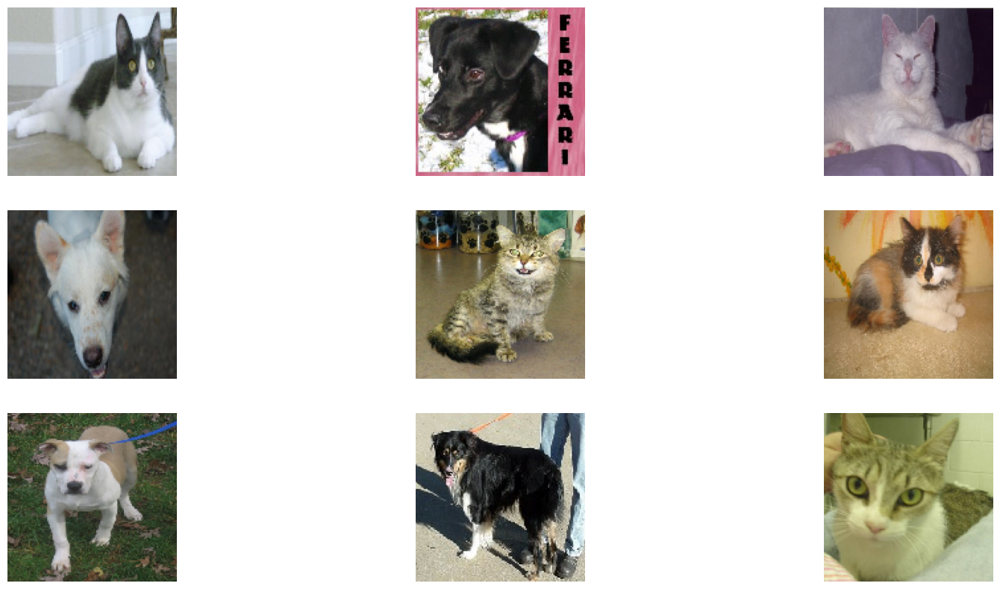

In [85]:
# Visualize the images that the VGG16 makes strongly correct classifications
plot_on_grid(test_set, strongly_right_idx)

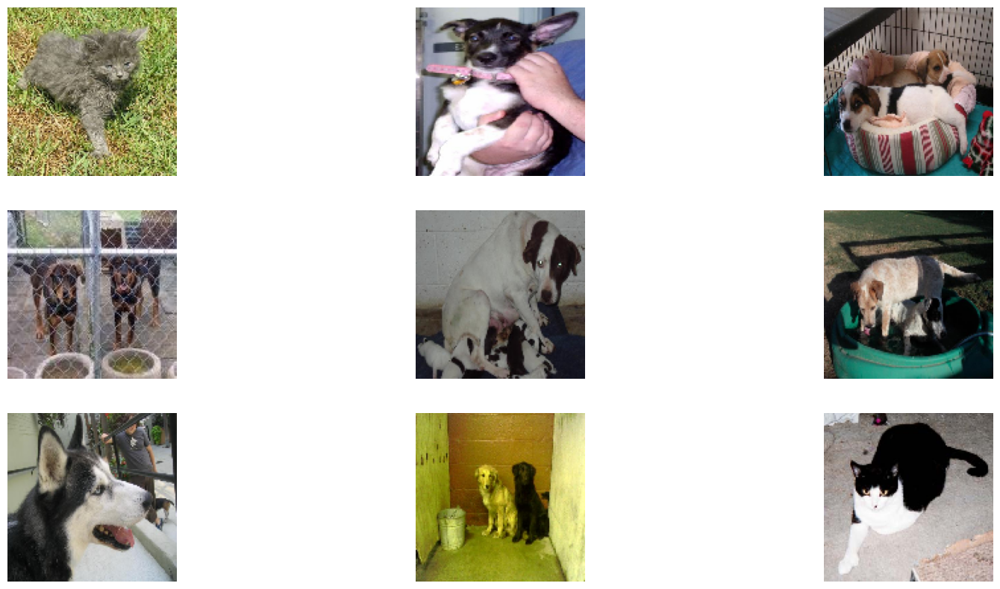

In [86]:
# Visualize the images that the VGG16 makes strongly wrong classifications
# We can tell the photos are challenging for VGG16 model to classify correctly.
plot_on_grid(test_set, strongly_wrong_idx)

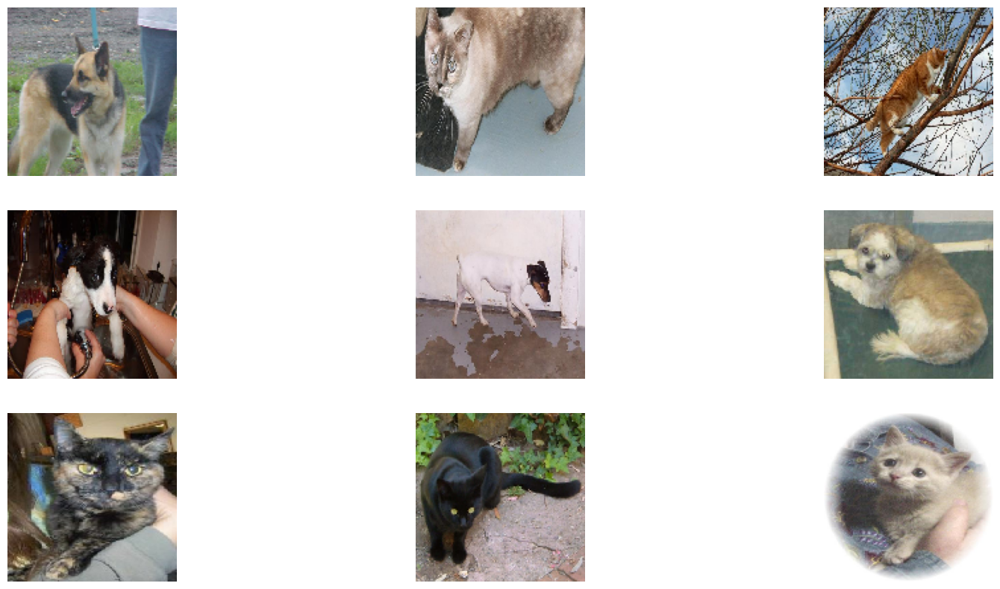

In [87]:
# Visualize the images that the VGG16 makes weakly wrong classifications
# These photos contain information that's hard for VGG16 to identify whether a dog or a cat it is seeing.
plot_on_grid(test_set, weakly_wrong_idx)